In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

import numpy as np
import pickle 
import matplotlib.pyplot as plt

In [2]:
if torch.cuda.is_available():
  device = torch.device("cuda:0")
  print("GPU")
else:
  device = torch.device("cpu")
  print("CPU")

GPU


In [3]:
# transform = torchvision.transforms.Compose([
#     torchvision.transforms.ToTensor(),
#     torchvision.transforms.Lambda(lambda x: x*255)
#     # rescaling required? 
# ])

transform = transforms.Compose(
    [
        transforms.ToTensor(),
        # transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
        # transforms.Normalize((0.4914, 0.4822, 0.4465), (0.247, 0.243, 0.261)),
    ]
)

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                        download=True, transform=transform)

batch_size_train = 128 #256 #64
batch_size_test = 100

train_loader = DataLoader(
    trainset, batch_size = batch_size_train, shuffle=True)
test_loader = DataLoader(
    testset, batch_size = batch_size_test, shuffle=False)

batch = next(iter(trainset))

print( torch.min(batch[0]), torch.max(batch[0]), torch.mean(batch[0]) )
del(batch)

Files already downloaded and verified
Files already downloaded and verified
tensor(0.) tensor(1.) tensor(0.4057)


In [4]:
class VAE_short(nn.Module):
    def __init__(self, latent_dim, img_size):
        super(VAE, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
#            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
#            nn.BatchNorm2d(64),
#            nn.ReLU(),
#            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
#            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(64 * (img_size // 4) * (img_size // 4), 256),
            nn.ReLU(),
        )

        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 64 * (img_size // 4) * (img_size // 4)),
            nn.ReLU(),
            nn.Unflatten(1, (64, img_size // 4, img_size // 4)),
#            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
#            nn.BatchNorm2d(64),
#            nn.LeakyReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
 #           nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            #nn.Sigmoid() # paper used sigmoid function at last
        )

    def reparameterize_sampling(self, mu, logvar):
        std = logvar.exp().sqrt()
        eps = torch.randn_like(mu).to(device)
        return mu + eps * std

    def forward(self, x):
        x = self.encoder(x)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        z = self.reparameterize_sampling(mu, logvar)
        x_reconstructed = self.decoder(z)
        return x_reconstructed, mu, logvar

    def decode(self, z):
      return self.decoder(z)

class VAE(nn.Module):
    def __init__(self, latent_dim, img_size):
        super(VAE, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
            # nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            # nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            # nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.Flatten(),
            nn.Linear(128 * (img_size // 8) * (img_size // 8), 256),
            nn.LeakyReLU(),
        )

        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.LeakyReLU(),
            nn.Linear(256, 128 * (img_size // 8) * (img_size // 8)),
            nn.LeakyReLU(),
            nn.Unflatten(1, (128, img_size // 8, img_size // 8)),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            # nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            # nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            #nn.Sigmoid() # paper used sigmoid function at last
        )

    def reparameterize_sampling(self, mu, logvar):
        std = logvar.exp().sqrt()
        eps = torch.randn_like(mu).to(device)
        return mu + eps * std

    def forward(self, x):
        x = self.encoder(x)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        z = self.reparameterize_sampling(mu, logvar)
        x_reconstructed = self.decoder(z)
        return x_reconstructed, mu, logvar

    def decode(self, z):
      return self.decoder(z)

class SupervisedVAE(nn.Module):
    def __init__(self, latent_dim, img_size, num_classes):
        super(SupervisedVAE, self).__init__()
        self.vae = VAE(latent_dim, img_size)
        self.classifier = nn.Linear(latent_dim, num_classes)
        # self.classifier = nn.Sequential(
        #     # nn.Linear(latent_dim, 256),
        #     # nn.LeakyReLU(),
        #     nn.Linear(latent_dim, num_classes)
        #     #nn.Softmax() ?
        # )

    def forward(self, x):
        x_reconstructed, mu, logvar = self.vae(x)
        class_logits = self.classifier(mu)
        return x_reconstructed, mu, logvar, class_logits
    
class SupervisedVAE_basic(nn.Module):
    def __init__(self, latent_dim, img_size, num_classes, VAE_instance):
        super(SupervisedVAE_basic, self).__init__()
        # assumed that the architecture of VAE is already determined
        self.vae = VAE_instance
        self.classifier = nn.Linear(latent_dim, num_classes)
    
    def forward(self, x):
        x_reconstructed, mu, logvar = self.vae(x)
        class_logits = self.classifier(mu)
        return x_reconstructed, mu, logvar, class_logits

# define loss functions
def KL_divergence(z_mu, z_log_sigma_sq):
  term_1 = z_log_sigma_sq.sum(axis=1) # trace log Sigma q
  term_2 = z_log_sigma_sq.exp().sum(axis=1) # trace Sigma q
  term_3 = (z_mu*z_mu).sum(axis=1) # this is mu_q squared and summed
  return 0.5*(-term_1 + term_2 + term_3 - z_mu.shape[1]).mean()

# def kl_divergence_2(mu, logvar):
#     kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
#     return kld_loss

MSELoss = torch.nn.MSELoss(reduction='sum')

In [6]:
# some parameters for the model
# latent_dim = 128
lr = 3e-4
# lr2 = 0.00005
# num_epochs = 200
# beta = 1 #2
# gamma = 1 #1.5

num_cat = 10
img_size= 32

latent_dim128 = 128
latent_dim64 = 64

# define network ----------------------------------------------
VAE_instance = VAE(latent_dim128,img_size).to(device)
# VAE_instance.load_state_dict(torch.load('vae_cifar-10_sum_dim128_final.pth',map_location=device))

SVAE_instance = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_instance.load_state_dict(torch.load('svae_cifar-10_sum_dim128_basic.pth',map_location=device))

SVAE_instance.eval()

SupervisedVAE_basic(
  (vae): VAE(
    (encoder): Sequential(
      (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): LeakyReLU(negative_slope=0.01)
      (4): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): LeakyReLU(negative_slope=0.01)
      (6): Flatten(start_dim=1, end_dim=-1)
      (7): Linear(in_features=2048, out_features=256, bias=True)
      (8): LeakyReLU(negative_slope=0.01)
    )
    (fc_mu): Linear(in_features=256, out_features=128, bias=True)
    (fc_logvar): Linear(in_features=256, out_features=128, bias=True)
    (decoder): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
      (2): Linear(in_features=256, out_features=2048, bias=True)
      (3): LeakyReLU(negative_slope=0.01)
      (4): Unflatten(dim=1, unflattened_size=(12

In [25]:
SVAE_instance2 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_instance2.load_state_dict(torch.load('svae_cifar-10_sum_dim128_gamma100_basic.pth',map_location=device))
SVAE_instance2.eval()

SVAE_instance3 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_instance3.load_state_dict(torch.load('svae_cifar-10_sum_dim128_gamma250_basic.pth',map_location=device))
SVAE_instance3.eval()

SupervisedVAE_basic(
  (vae): VAE(
    (encoder): Sequential(
      (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): LeakyReLU(negative_slope=0.01)
      (4): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): LeakyReLU(negative_slope=0.01)
      (6): Flatten(start_dim=1, end_dim=-1)
      (7): Linear(in_features=2048, out_features=256, bias=True)
      (8): LeakyReLU(negative_slope=0.01)
    )
    (fc_mu): Linear(in_features=256, out_features=128, bias=True)
    (fc_logvar): Linear(in_features=256, out_features=128, bias=True)
    (decoder): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
      (2): Linear(in_features=256, out_features=2048, bias=True)
      (3): LeakyReLU(negative_slope=0.01)
      (4): Unflatten(dim=1, unflattened_size=(12

In [82]:
SVAE_instance4 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_instance4.load_state_dict(torch.load('svae_cifar-10_sum_dim128_gamma1_basic_conly.pth',map_location=device))
SVAE_instance4.eval()

SVAE_instance5 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_instance5.load_state_dict(torch.load('svae_cifar-10_sum_dim128_gamma100_basic_conly.pth',map_location=device))
SVAE_instance5.eval()

SVAE_instance4opt = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_instance4opt.load_state_dict(torch.load('./saved_params_cvae_cifar-10_dim128_gamma1_basic_conly/'+'0.pth',map_location=device))
SVAE_instance4opt.eval()

SVAE_last0 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_last25 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_last63 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_last100 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)

SVAE_last0.load_state_dict(torch.load('./saved_params_svae_cifar-10_dim128_gamma1_basic_c10/'+'0.pth',map_location=device))
SVAE_last25.load_state_dict(torch.load('./saved_params_svae_cifar-10_dim128_gamma1_basic_c10/'+'25.pth',map_location=device))
SVAE_last63.load_state_dict(torch.load('./saved_params_svae_cifar-10_dim128_gamma1_basic_c10/'+'63.pth',map_location=device))
SVAE_last100.load_state_dict(torch.load('svae_cifar-10_sum_dim128_gamma1_basic_c10.pth',map_location=device))

SVAE_last0.eval()
SVAE_last25.eval()
SVAE_last63.eval()
SVAE_last100.eval()

SupervisedVAE_basic(
  (vae): VAE(
    (encoder): Sequential(
      (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): LeakyReLU(negative_slope=0.01)
      (4): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): LeakyReLU(negative_slope=0.01)
      (6): Flatten(start_dim=1, end_dim=-1)
      (7): Linear(in_features=2048, out_features=256, bias=True)
      (8): LeakyReLU(negative_slope=0.01)
    )
    (fc_mu): Linear(in_features=256, out_features=128, bias=True)
    (fc_logvar): Linear(in_features=256, out_features=128, bias=True)
    (decoder): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
      (2): Linear(in_features=256, out_features=2048, bias=True)
      (3): LeakyReLU(negative_slope=0.01)
      (4): Unflatten(dim=1, unflattened_size=(12

In [73]:
# load save train/test losses

# --- VAE training ---
with open('losses_train_just_sum_dim128_final.pkl','rb') as fp:
    losses_train = pickle.load(fp)

with open('losses_test_just_sum_dim128_final.pkl','rb') as fp:
    losses_test = pickle.load(fp)

# --- SVAE-basic from VAE ---
with open('svae_losses_train_sum_dim128_basic.pkl','rb') as fp:
    losses_train2 = pickle.load(fp)

with open('svae_losses_test_sum_dim128_basic.pkl','rb') as fp:
    losses_test2 = pickle.load(fp)

# --- SVAE-basic from VAE ---
with open('svae_losses_train_sum_dim128_gamma100_basic.pkl','rb') as fp:
    losses_train3 = pickle.load(fp)

with open('svae_losses_test_sum_dim128_gamma100_basic.pkl','rb') as fp:
    losses_test3 = pickle.load(fp)

# --- SVAE-basic from VAE ---
with open('svae_losses_train_sum_dim128_gamma250_basic.pkl','rb') as fp:
    losses_train4 = pickle.load(fp)

with open('svae_losses_test_sum_dim128_gamma250_basic.pkl','rb') as fp:
    losses_test4 = pickle.load(fp)

# --- SVAE-basic from VAE ---
with open('svae_losses_train_sum_dim128_gamma1_basic_conly.pkl','rb') as fp:
    losses_train5 = pickle.load(fp)

with open('svae_losses_test_sum_dim128_gamma1_basic_conly.pkl','rb') as fp:
    losses_test5 = pickle.load(fp)

# --- SVAE-basic from VAE ---
with open('svae_losses_train_sum_dim128_gamma100_basic_conly.pkl','rb') as fp:
    losses_train6 = pickle.load(fp)

with open('svae_losses_test_sum_dim128_gamma100_basic_conly.pkl','rb') as fp:
    losses_test6 = pickle.load(fp)


# --- SVAE-basic from VAE ---
with open('svae_losses_train_sum_dim128_gamma1_basic_c10.pkl','rb') as fp:
    losses_train7 = pickle.load(fp)

with open('svae_losses_test_sum_dim128_gamma1_basic_c10.pkl','rb') as fp:
    losses_test7 = pickle.load(fp)

In [8]:
def plot_losses(losses_train,losses_test,supt='train/test loss',figsize=(8,8),is_svae=True):

    if is_svae:
        fig, axs = plt.subplots(2,2,figsize=figsize)

        axs[0,0].plot(losses_train['total'],label='train total loss')
        axs[0,0].plot(losses_test['total'],label='test total loss')
        axs[0,0].set_title('total loss')

        axs[0,1].plot(losses_train['mse'],label='train')
        axs[0,1].plot(losses_test['mse'],label='test')
        axs[0,1].set_title('MSE loss')

        axs[1,0].plot(losses_train['KLD'],label='train')
        axs[1,0].plot(losses_test['KLD'],label='test')
        axs[1,0].set_title('KL loss')

        axs[1,1].plot(losses_train['class'],label='train')
        axs[1,1].plot(losses_test['class'],label='test')
        axs[1,1].set_title('class loss')

        plt.suptitle(supt)

        
        for i in range(2):
            for j in range(2):
                axs[i,j].set_xlabel('Epoch')
                axs[i,j].set_ylabel('Total Loss')
        axs[1,1].legend(bbox_to_anchor=(1,-0.3))
        plt.tight_layout()
        plt.show()

    else:
        fig, axs = plt.subplots(1,3,figsize=figsize)
        axs[0].plot(losses_train['total'],label='train total loss')
        axs[0].plot(losses_test['total'],label='test total loss')
        axs[0].set_title('total loss')

        axs[1].plot(losses_train['mse'],label='train')
        axs[1].plot(losses_test['mse'],label='test')
        axs[1].set_title('MSE loss')

        axs[2].plot(losses_train['KLD'],label='train')
        axs[2].plot(losses_test['KLD'],label='test')
        axs[2].set_title('KL loss')
    
        plt.suptitle(supt)

        for i in range(3):
            axs[i].set_xlabel('Epoch')
            axs[i].set_ylabel('Total Loss')
        axs[2].legend(bbox_to_anchor=(1,-0.3))
        plt.tight_layout()
        plt.show()

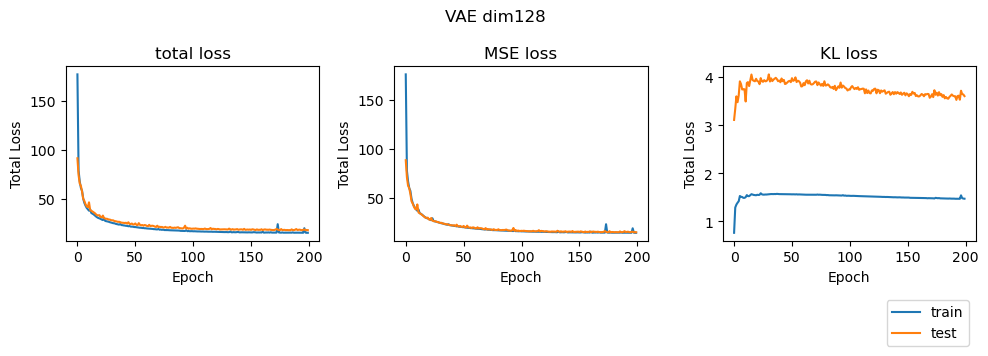

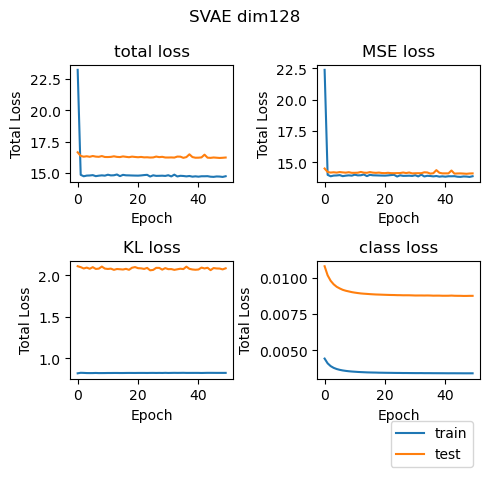

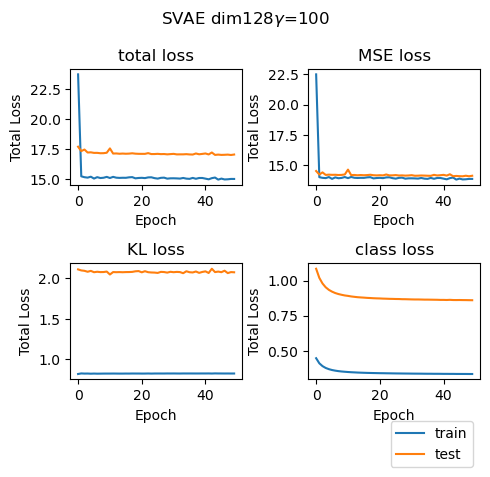

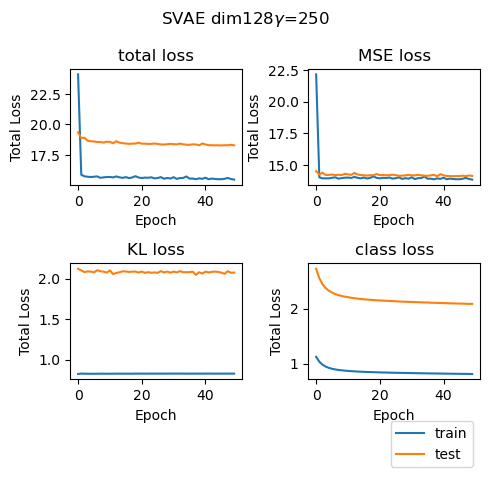

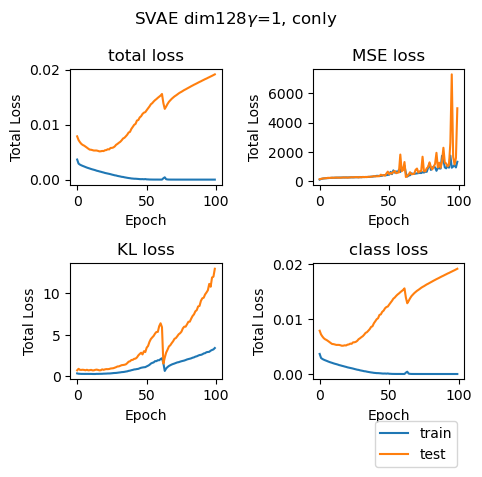

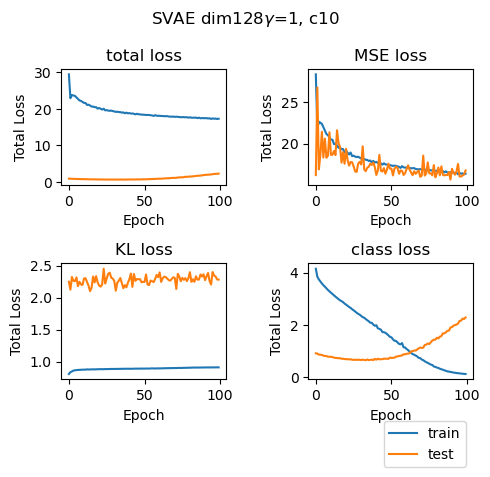

In [74]:
fs = (10,4)

plot_losses(losses_train,losses_test,'VAE dim128',figsize=fs,is_svae=False)

plot_losses(losses_train2,losses_test2,'SVAE dim128',figsize=(5,5),is_svae=True)

plot_losses(losses_train3,losses_test3,'SVAE dim128'+r'$\gamma$=100',figsize=(5,5),is_svae=True)

plot_losses(losses_train4,losses_test4,'SVAE dim128'+r'$\gamma$=250',figsize=(5,5),is_svae=True)

plot_losses(losses_train5,losses_test5,'SVAE dim128'+r'$\gamma$=1, conly',figsize=(5,5),is_svae=True)

plot_losses(losses_train7,losses_test7,'SVAE dim128'+r'$\gamma$=1, c10',figsize=(5,5),is_svae=True)

# plot_losses(losses_train6,losses_test6,'SVAE dim128'+r'$\gamma$=100, conly',figsize=(5,5),is_svae=True)



visualized latent sapce

In [16]:
import umap 
from sklearn.decomposition import PCA 
from sklearn.manifold import MDS
from sklearn.manifold import TSNE

def encode_dataset(model, dataloader):
    encoded_data = []
    labels = []
    with torch.no_grad():
        for x, label in dataloader:
            x = x.to(device)
            # label = nn.functional.one_hot(label,num_classes=num_cat).float()
            label = label.to(device)
            mu = model.forward(x)[1]
            encoded_data.append(mu.cpu().numpy())
            labels.append(label.cpu().numpy())
    encoded_data = np.concatenate(encoded_data)
    labels = np.concatenate(labels)

    # labels = np.argmax(labels,axis=1)

    return encoded_data, labels

# Uniform Manifold Approximation and Projection (UMAP). UMAP is particularly well-suited for preserving both local and global structure in the data.
reducer_umap = umap.UMAP(n_components=2)
reducer_pca = PCA(n_components=2)
reducer_mds = MDS(n_components=2)
reducer_tsne = TSNE(n_components=2)

In [17]:
# ----- VAE n=128
## for the train dataset
encoded_data, labels = encode_dataset(VAE_instance, train_loader)
latent_umap = reducer_umap.fit_transform(encoded_data)
latent_tsne = reducer_tsne.fit_transform(encoded_data)
print('VAE128 - train')

## for the test dataset
encoded_data_val, labels_val = encode_dataset(VAE_instance, test_loader)
latent_val_umap = reducer_umap.fit_transform(encoded_data_val)
latent_val_tsne = reducer_tsne.fit_transform(encoded_data_val)
print('VAE128 - test')

# ----- SVAE n=128
## for the train dataset
encoded_data2, labels2 = encode_dataset(SVAE_instance, train_loader)
latent2_umap = reducer_umap.fit_transform(encoded_data2)
latent2_tsne = reducer_tsne.fit_transform(encoded_data2)
print('SVAE128 - train')

## for the test dataset
encoded_data2_val, labels2_val = encode_dataset(SVAE_instance, test_loader)
latent2_val_umap = reducer_umap.fit_transform(encoded_data2_val)
latent2_val_tsne = reducer_tsne.fit_transform(encoded_data2_val)
print('SVAE128 - test')

VAE128 - train
VAE128 - test
SVAE128 - train
SVAE128 - test


In [28]:
# ----- SVAE n=128
## for the train dataset
encoded_data3, labels3 = encode_dataset(SVAE_instance2, train_loader)
latent3_umap = reducer_umap.fit_transform(encoded_data3)
latent3_tsne = reducer_tsne.fit_transform(encoded_data3)
print('SVAE128 - train - gamma100')

## for the test dataset
encoded_data3_val, labels3_val = encode_dataset(SVAE_instance2, test_loader)
latent3_val_umap = reducer_umap.fit_transform(encoded_data3_val)
latent3_val_tsne = reducer_tsne.fit_transform(encoded_data3_val)
print('SVAE128 - test - gamma100')

# ----- SVAE n=128
## for the train dataset
encoded_data4, labels4 = encode_dataset(SVAE_instance3, train_loader)
latent4_umap = reducer_umap.fit_transform(encoded_data4)
latent4_tsne = reducer_tsne.fit_transform(encoded_data4)
print('SVAE128 - train - gamma250')

## for the test dataset
encoded_data4_val, labels4_val = encode_dataset(SVAE_instance3, test_loader)
latent4_val_umap = reducer_umap.fit_transform(encoded_data4_val)
latent4_val_tsne = reducer_tsne.fit_transform(encoded_data4_val)
print('SVAE128 - test - gamma250')

SVAE128 - train - gamma100
SVAE128 - test - gamma100
SVAE128 - train - gamma250
SVAE128 - test - gamma250


In [35]:
# ----- SVAE n=128
## for the train dataset
encoded_data5, labels5 = encode_dataset(SVAE_instance4, train_loader)
latent5_umap = reducer_umap.fit_transform(encoded_data5)
latent5_tsne = reducer_tsne.fit_transform(encoded_data5)
print('SVAE128 - train - gamma1 conly')

## for the test dataset
encoded_data5_val, labels5_val = encode_dataset(SVAE_instance4, test_loader)
latent5_val_umap = reducer_umap.fit_transform(encoded_data5_val)
latent5_val_tsne = reducer_tsne.fit_transform(encoded_data5_val)
print('SVAE128 - test - gamma1 conly')

SVAE128 - train - gamma1 conly
SVAE128 - test - gamma1 conly


In [85]:
# save memory
del(encoded_data5, labels5, latent5_umap, latent5_tsne, encoded_data5_val,labels5_val,\
    latent5_val_umap, latent5_val_tsne)

In [88]:
encoded_data_last25, labels_last25 = encode_dataset(SVAE_last25, train_loader)
encoded_data_last63, labels_last63 = encode_dataset(SVAE_last63, train_loader)
encoded_data_last100, labels_last100 = encode_dataset(SVAE_last100, train_loader)
print('train encoding done')

encoded_data_last25_val, labels_last25_val = encode_dataset(SVAE_last25, test_loader)
encoded_data_last63_val, labels_last63_val = encode_dataset(SVAE_last63, test_loader)
encoded_data_last100_val, labels_last100_val = encode_dataset(SVAE_last100, test_loader)
print('test encoding done')

latent_last25_umap = reducer_umap.fit_transform(encoded_data_last25)
latent_last63_tsne = reducer_tsne.fit_transform(encoded_data_last63)
latent_last100_tsne = reducer_tsne.fit_transform(encoded_data_last100)
print('train encoding2 done')

latent_last25_val_umap = reducer_umap.fit_transform(encoded_data_last25_val)
latent_last63_val_tsne = reducer_tsne.fit_transform(encoded_data_last63_val)
latent_last100_val_tsne = reducer_tsne.fit_transform(encoded_data_last100_val)
print('test encoding2 done')

np.savez('latent_svae_dim128_gamma1_c10.npz', \
         encoded25=encoded_data_last25, \
         encoded63=encoded_data_last63, \
         encoded100=encoded_data_last100,\
         labels25=labels_last25, labels63=labels_last63, labels100=labels_last100)

np.savez('latent_val_svae_dim128_gamma1_c10.npz', \
         encoded25_val=encoded_data_last25_val, \
         encoded63_val=encoded_data_last63_val, \
         encoded100_val=encoded_data_last100_val,\
         labels25_val=labels_last25_val, labels63_val=labels_last63_val, labels100_val=labels_last100_val)

train encoding done
test encoding done
train encoding2 done
test encoding2 done


In [89]:
latent_last25_umap = reducer_umap.fit_transform(encoded_data_last25)
latent_last25_tsne = reducer_tsne.fit_transform(encoded_data_last25)

latent_last63_umap = reducer_umap.fit_transform(encoded_data_last63)
latent_last63_tsne = reducer_tsne.fit_transform(encoded_data_last63)

latent_last100_umap = reducer_umap.fit_transform(encoded_data_last100)
latent_last100_tsne = reducer_tsne.fit_transform(encoded_data_last100)
print('train encoding2 done')

latent_last25_val_umap = reducer_umap.fit_transform(encoded_data_last25_val)
latent_last25_val_tsne = reducer_tsne.fit_transform(encoded_data_last25_val)

latent_last63_val_umap = reducer_umap.fit_transform(encoded_data_last63_val)
latent_last63_val_tsne = reducer_tsne.fit_transform(encoded_data_last63_val)

latent_last100_val_umap = reducer_umap.fit_transform(encoded_data_last100_val)
latent_last100_val_tsne = reducer_tsne.fit_transform(encoded_data_last100_val)

print('test encoding2 done')

train encoding2 done
test encoding2 done


In [159]:
SVAE_instance.classifier

Linear(in_features=128, out_features=10, bias=True)

In [135]:
SVAE_last45 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_last45.load_state_dict(torch.load('./saved_params_svae_cifar-10_dim128_gamma1_basic_c10/'+'45.pth',map_location=device))
SVAE_last45.eval()

encoded_data_last45, labels_last45 = encode_dataset(SVAE_last45, train_loader)
encoded_data_last45_val, labels_last45_val = encode_dataset(SVAE_last45, test_loader)
print('encoding done')

latent_last45_umap = reducer_umap.fit_transform(encoded_data_last45)
latent_last45_tsne = reducer_tsne.fit_transform(encoded_data_last45)
print('train')

latent_last45_val_umap = reducer_umap.fit_transform(encoded_data_last45_val)
latent_last45_val_tsne = reducer_tsne.fit_transform(encoded_data_last45_val)
print('test')

np.savez('latent_val_svae_dim128_gamma1_c10_epoch45.npz', \
         encoded45=encoded_data_last45, \
         encoded45_val=encoded_data_last45_val, \
         labels45=labels_last45, labels45_val=labels_last45_val,\
         latent_last45_umap=latent_last45_umap, latent_last45_tsne=latent_last45_tsne,\
         latent_last45_val_umap=latent_last45_val_umap, latent_last45_val_tsne=latent_last45_val_tsne)

encoding done
train
test


In [158]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

silhouette_avg = silhouette_score(encoded_data_last45,labels_last45) 
print(f"Silhouette Score: {silhouette_avg}")

davies_bouldin_idx = davies_bouldin_score(encoded_data_last45,labels_last45)
print(f"Davies-Bouldin Index: {davies_bouldin_idx}")

calinski_harabasz_idx = calinski_harabasz_score(encoded_data_last45,labels_last45)
print(f"Calinski-Harabasz Index: {calinski_harabasz_idx}")

Silhouette Score: -0.04655325040221214
Davies-Bouldin Index: 9.97244168232247
Calinski-Harabasz Index: 405.6418120362616


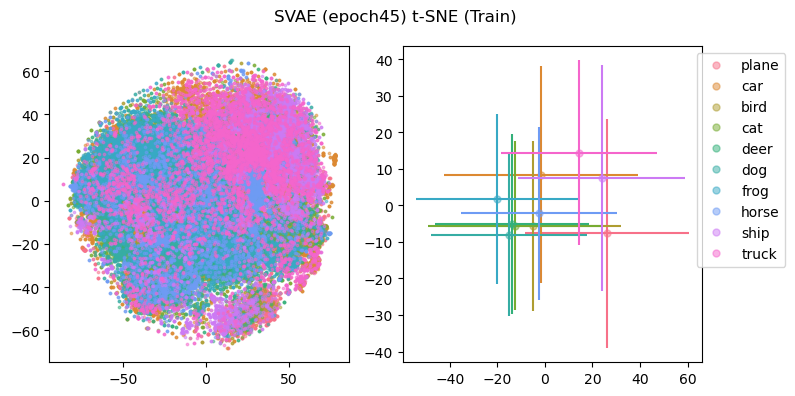

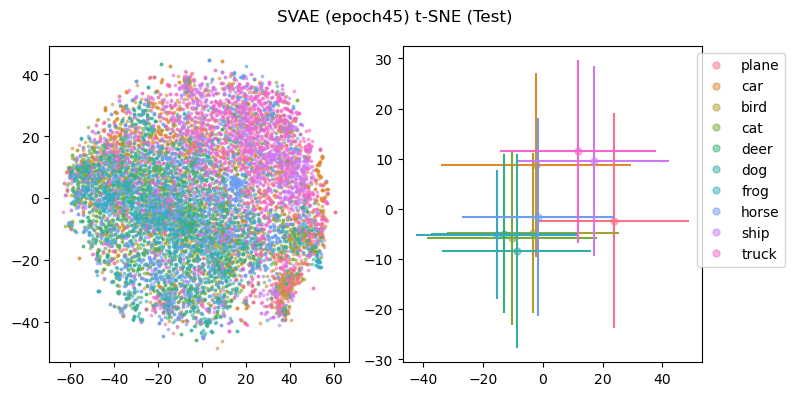

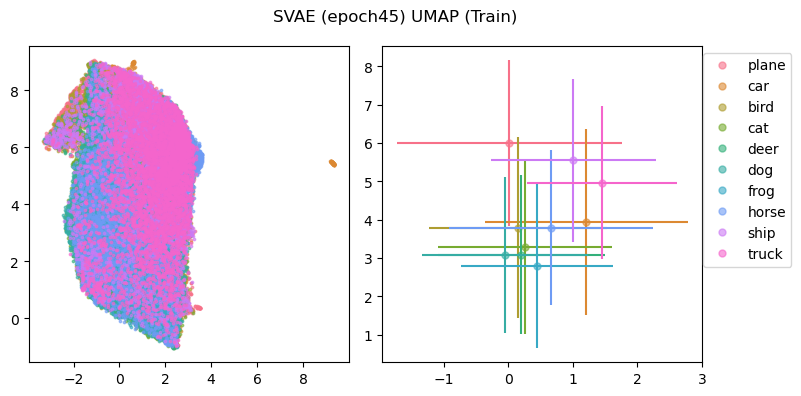

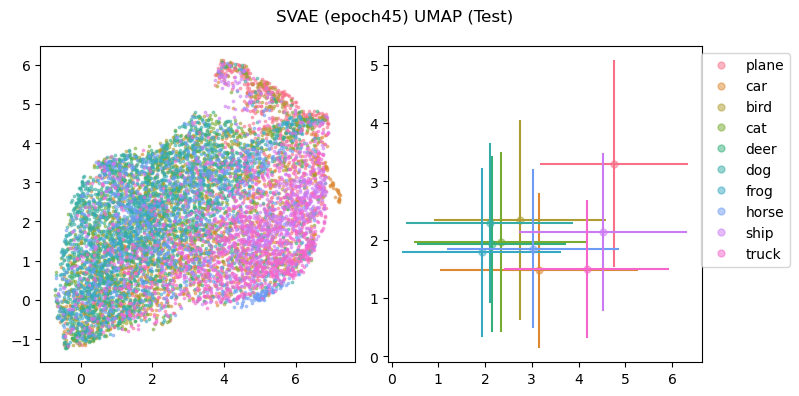

In [160]:
s=3
s2=5
xlim=None#(-80,80)
ylim=None#(-80,80)

xlim2=None#(-50,50)
ylim2=None#(-50,50)

plot_latent2(latent_last45_tsne,labels_last45,title='SVAE (epoch45) t-SNE (Train)',average=True,figsize=(8,4),alpha=.5,s=s,s2=s2,xlim=xlim,ylim=ylim,xlim2=xlim2,ylim2=ylim2)
plot_latent2(latent_last45_val_tsne,labels_last45_val,title='SVAE (epoch45) t-SNE (Test)',average=True,figsize=(8,4),alpha=.5,s=s,s2=s2,xlim=xlim,ylim=ylim,xlim2=xlim2,ylim2=ylim2)

plot_latent2(latent_last45_umap,labels_last45,title='SVAE (epoch45) UMAP (Train)',average=True,figsize=(8,4),s=s,s2=s2)
plot_latent2(latent_last45_val_umap,labels_last45_val,title='SVAE (epoch45) UMAP (Test)',average=True,figsize=(8,4),alpha=.5,s=s,s2=s2)


Let's also plot the train image set!

In [153]:
import seaborn as sns

def plot_latent(latent,labels,title='latent representation',average=False,figsize=(5,5),alpha=0.6,xlim=None,ylim=None):

    cvals = sns.color_palette("husl",10)
    # tlabels_cval = [cvals[x] for x in labels]

    classes = ('plane', 'car', 'bird', 'cat',
               'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
    
    plt.figure(figsize=figsize)

    if not average:
        for i, val in enumerate(np.unique(labels)):
            this_idx = (labels == val)
            plt.scatter(latent[this_idx, 0], latent[this_idx, 1], color=cvals[i],alpha=alpha, label=classes[i])#, cmap='set1', s=5)

        plt.legend(bbox_to_anchor=(1,1))

    else:
        for i, val in enumerate(np.unique(labels)):
            this_idx = (labels == val)
            this_mean = latent[this_idx,].mean(axis=0)
            this_sd = latent[this_idx,].std(axis=0)

            plt.plot(this_mean[0],this_mean[1],'o',color=cvals[i], label=classes[i],alpha=alpha)
            plt.errorbar(this_mean[0],this_mean[1],yerr=this_sd[1],xerr=this_sd[0],color=cvals[i])
    
            plt.legend(bbox_to_anchor=(1.3,1))
    plt.title(title)

    if xlim is not None:
        plt.xlim(xlim)
    if ylim is not None:
        plt.ylim(ylim)

    plt.tight_layout()
    plt.show()

def plot_latent2(latent,labels,title='latent representation',average=False,figsize=(5,5),alpha=0.6,xlim=None,ylim=None,xlim2=None,ylim2=None,s=5,s2=8):

    cvals = sns.color_palette("husl",10)
    # tlabels_cval = [cvals[x] for x in labels]

    classes = ('plane', 'car', 'bird', 'cat',
               'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
    
    fig,axs = plt.subplots(1,2,figsize=figsize)


    for i, val in enumerate(np.unique(labels)):
        this_idx = (labels == val)
        axs[0].scatter(latent[this_idx, 0], latent[this_idx, 1], color=cvals[i],alpha=alpha, label=classes[i],s=s)#, cmap='set1', s=5)

    for i, val in enumerate(np.unique(labels)):
        this_idx = (labels == val)
        this_mean = latent[this_idx,].mean(axis=0)
        this_sd = latent[this_idx,].std(axis=0)

        axs[1].errorbar(this_mean[0],this_mean[1],yerr=this_sd[1],xerr=this_sd[0],color=cvals[i])
        axs[1].plot(this_mean[0],this_mean[1],'o',color=cvals[i], label=classes[i],alpha=alpha,markersize=s2)

    axs[1].legend(bbox_to_anchor=(1.3,1))

    plt.suptitle(title)

    if xlim is not None:
        axs[0].set_xlim(xlim)
    if ylim is not None:
        axs[0].set_ylim(ylim)

    if xlim2 is not None:
        axs[1].set_xlim(xlim)
    if ylim2 is not None:
        axs[1].set_ylim(ylim)
        
    plt.tight_layout()
    plt.show()


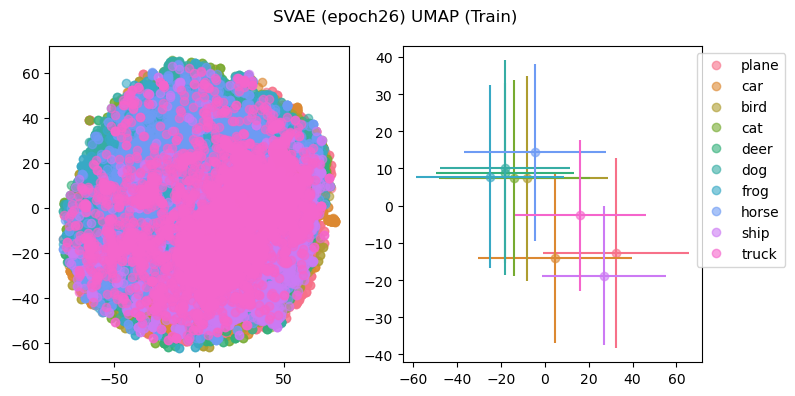

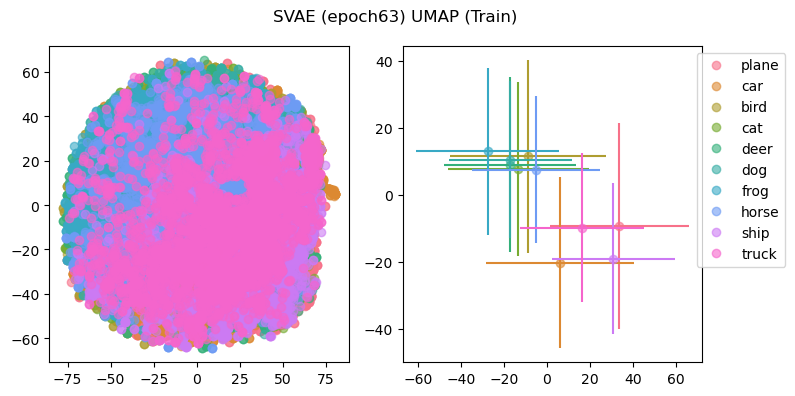

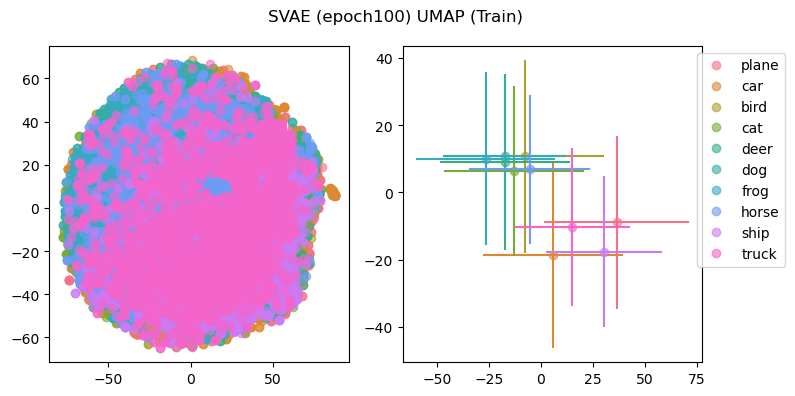

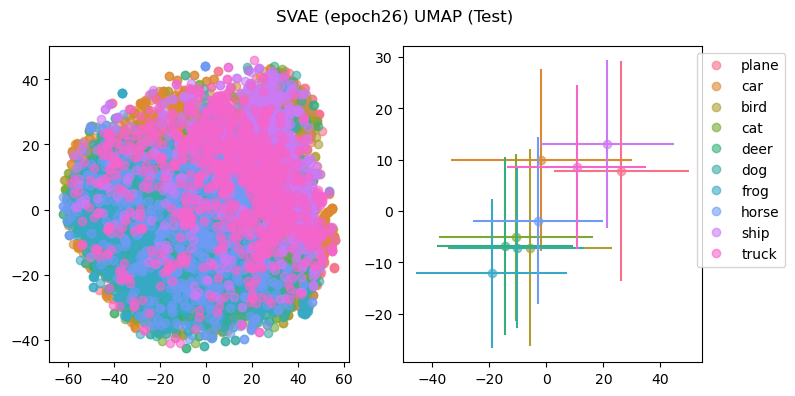

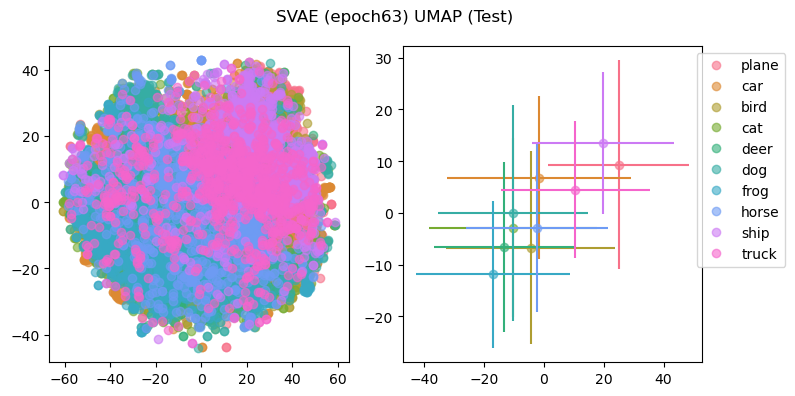

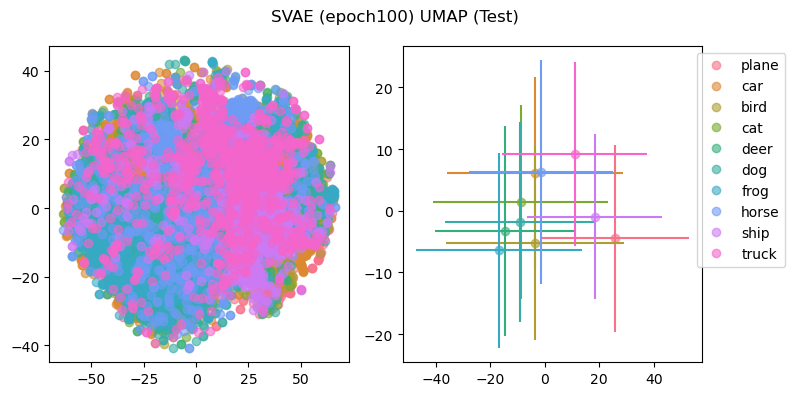

In [96]:
# plot_latent2(latent_last25_umap,labels_last25,title='SVAE (epoch26) UMAP (Train)',average=True,figsize=(8,4))
# plot_latent2(latent_last63_umap,labels_last63,title='SVAE (epoch63) UMAP (Train)',average=True,figsize=(8,4))
# plot_latent2(latent_last100_umap,labels_last100,title='SVAE (epoch100) UMAP (Train)',average=True,figsize=(8,4))

# plot_latent2(latent_last25_val_umap,labels_last25_val,title='SVAE (epoch26) UMAP (Test)',average=True,figsize=(8,4))
# plot_latent2(latent_last63_val_umap,labels_last63_val,title='SVAE (epoch63) UMAP (Test)',average=True,figsize=(8,4))
# plot_latent2(latent_last100_val_umap,labels_last100_val,title='SVAE (epoch100) UMAP (Test)',average=True,figsize=(8,4))

plot_latent2(latent_last25_tsne,labels_last25,title='SVAE (epoch26) UMAP (Train)',average=True,figsize=(8,4))
plot_latent2(latent_last63_tsne,labels_last63,title='SVAE (epoch63) UMAP (Train)',average=True,figsize=(8,4))
plot_latent2(latent_last100_tsne,labels_last100,title='SVAE (epoch100) UMAP (Train)',average=True,figsize=(8,4))

plot_latent2(latent_last25_val_tsne,labels_last25_val,title='SVAE (epoch26) UMAP (Test)',average=True,figsize=(8,4))
plot_latent2(latent_last63_val_tsne,labels_last63_val,title='SVAE (epoch63) UMAP (Test)',average=True,figsize=(8,4))
plot_latent2(latent_last100_val_tsne,labels_last100_val,title='SVAE (epoch100) UMAP (Test)',average=True,figsize=(8,4))


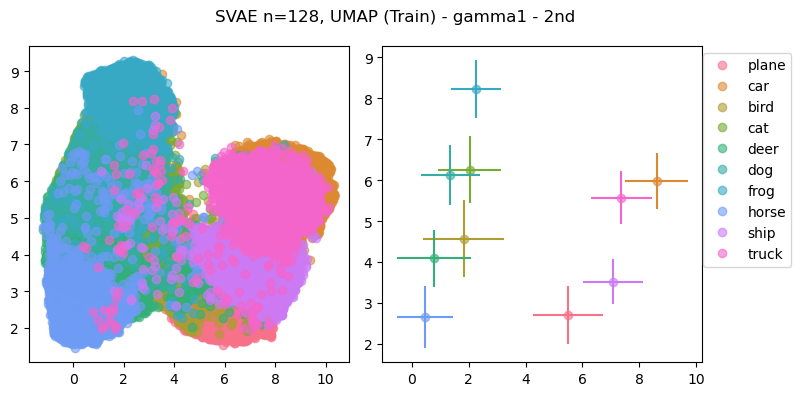

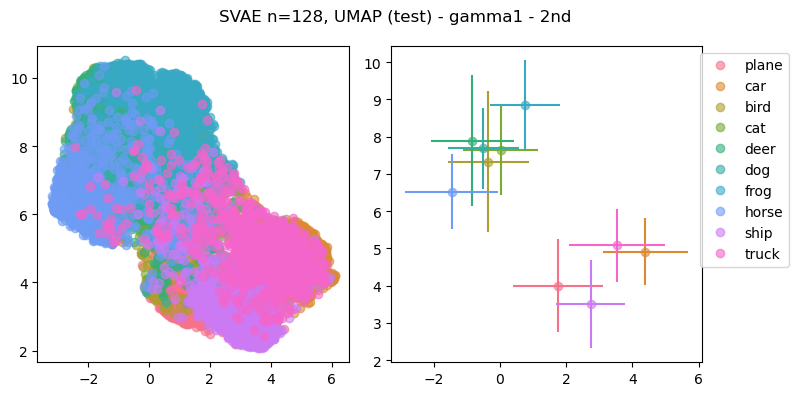

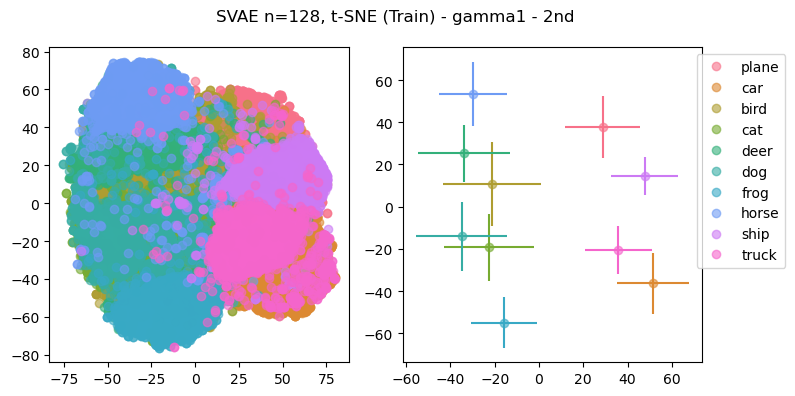

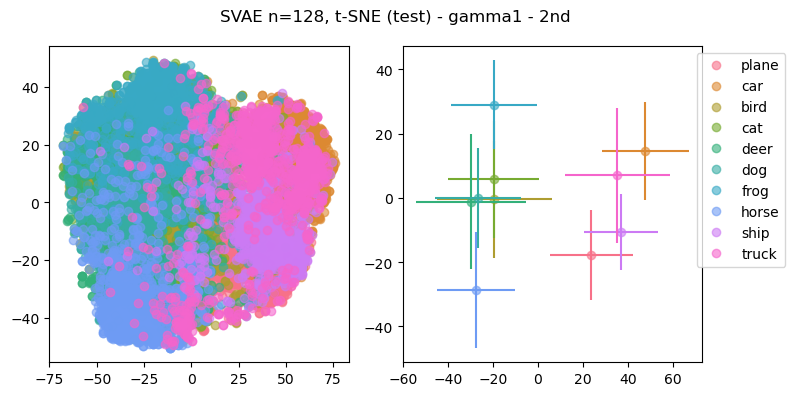

In [38]:
plot_latent2(latent5_umap,labels5,title='SVAE n=128, UMAP (Train) - gamma1 - 2nd',average=True,figsize=(8,4))
plot_latent2(latent5_val_umap,labels5_val,title='SVAE n=128, UMAP (test) - gamma1 - 2nd',average=True,figsize=(8,4))

plot_latent2(latent5_tsne,labels5,title='SVAE n=128, t-SNE (Train) - gamma1 - 2nd',average=True,figsize=(8,4))
plot_latent2(latent5_val_tsne,labels5_val,title='SVAE n=128, t-SNE (test) - gamma1 - 2nd',average=True,figsize=(8,4))

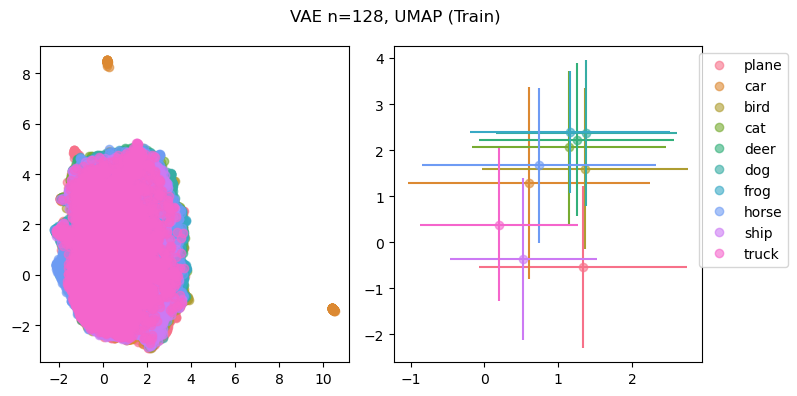

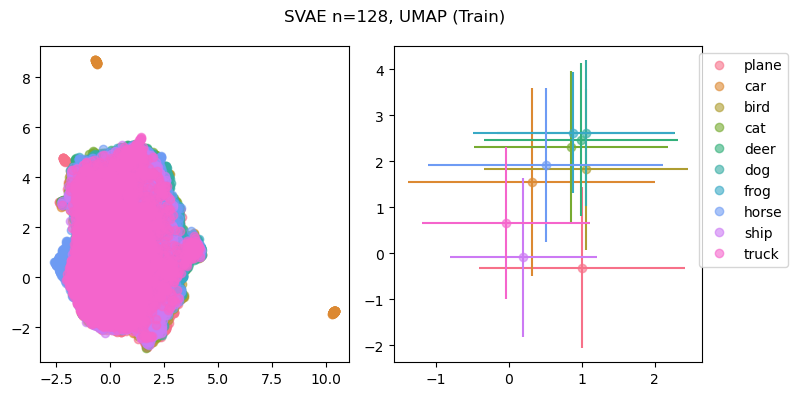

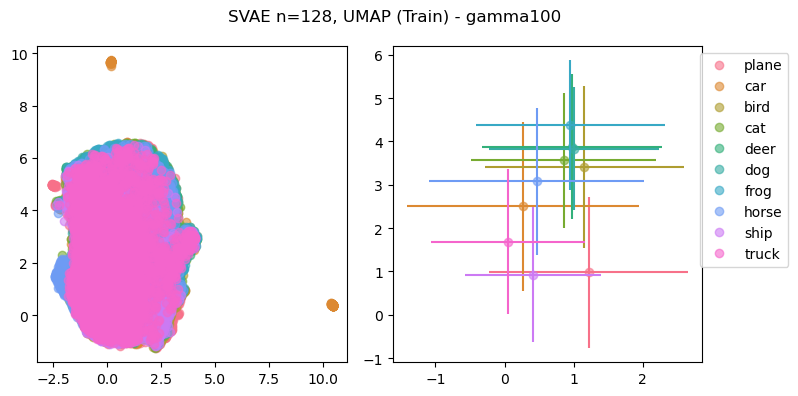

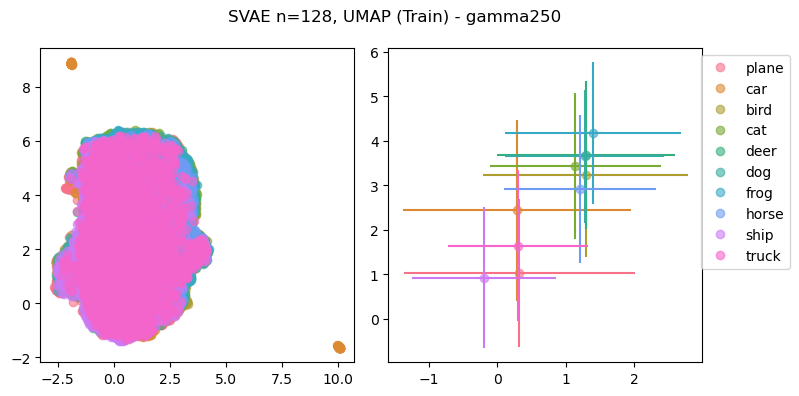

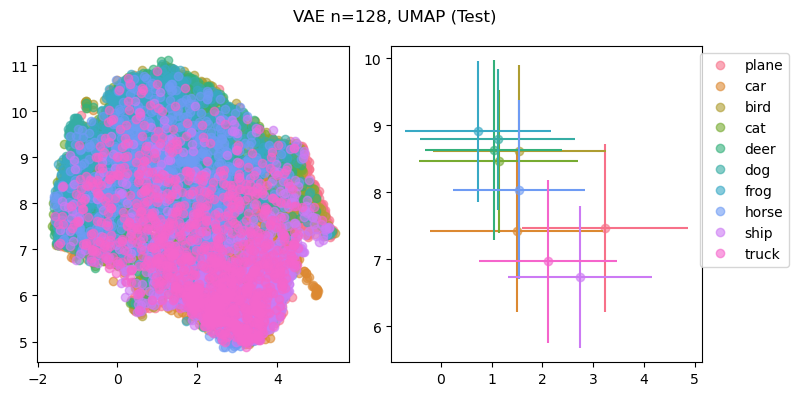

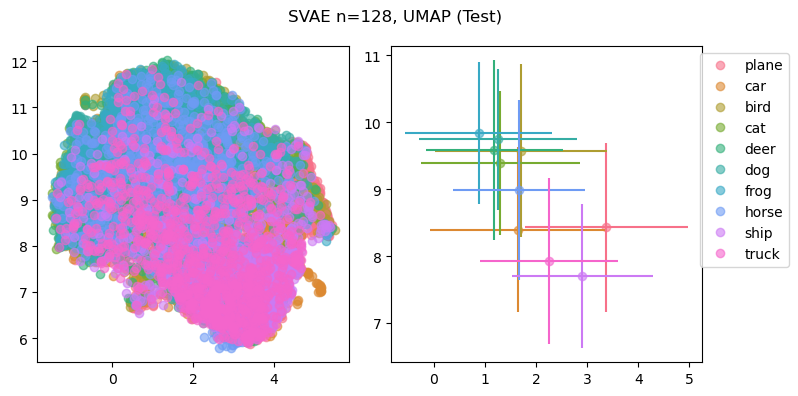

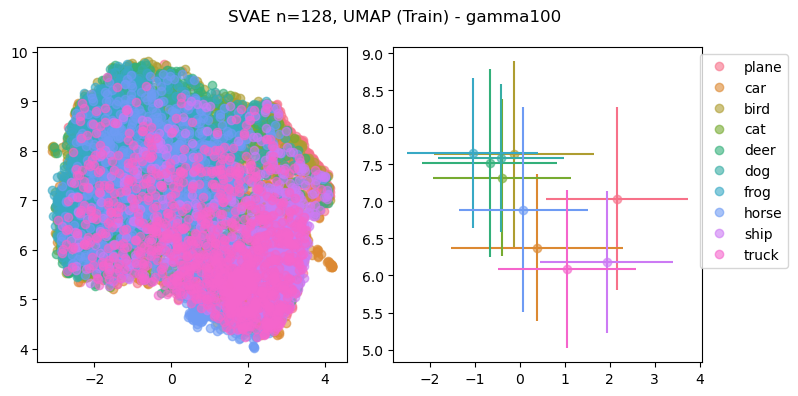

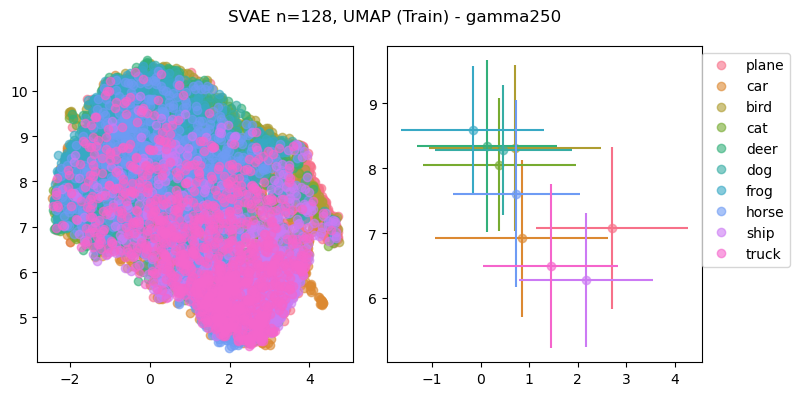

In [29]:
plot_latent2(latent_umap,labels,title='VAE n=128, UMAP (Train)',average=True,figsize=(8,4))
plot_latent2(latent2_umap,labels2,title='SVAE n=128, UMAP (Train)',average=True,figsize=(8,4))
plot_latent2(latent3_umap,labels3,title='SVAE n=128, UMAP (Train) - gamma100',average=True,figsize=(8,4))
plot_latent2(latent4_umap,labels4,title='SVAE n=128, UMAP (Train) - gamma250',average=True,figsize=(8,4))


plot_latent2(latent_val_umap,labels_val,title='VAE n=128, UMAP (Test)',average=True,figsize=(8,4))
plot_latent2(latent2_val_umap,labels2_val,title='SVAE n=128, UMAP (Test)',average=True,figsize=(8,4))
plot_latent2(latent3_val_umap,labels3_val,title='SVAE n=128, UMAP (Train) - gamma100',average=True,figsize=(8,4))
plot_latent2(latent4_val_umap,labels4_val,title='SVAE n=128, UMAP (Train) - gamma250',average=True,figsize=(8,4))


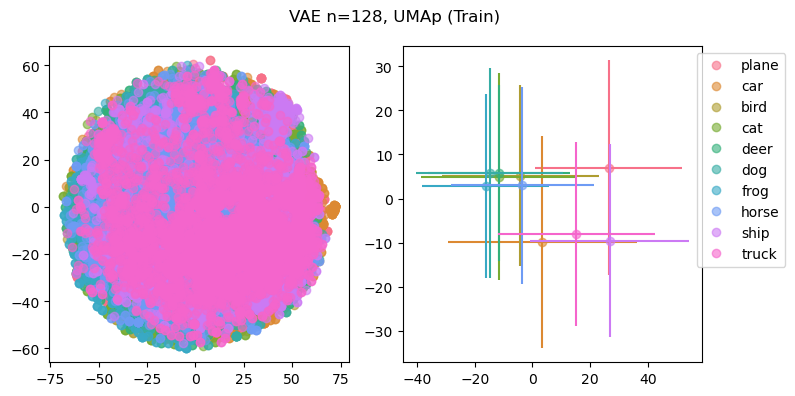

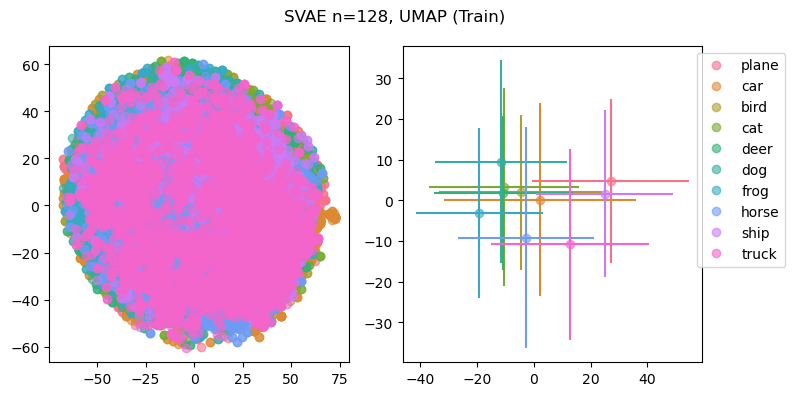

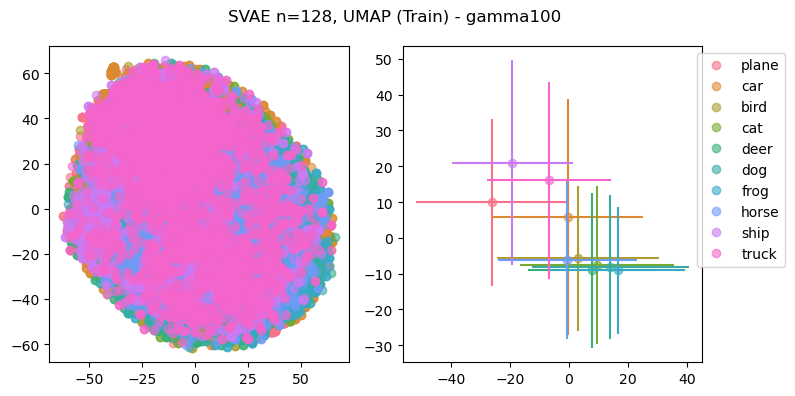

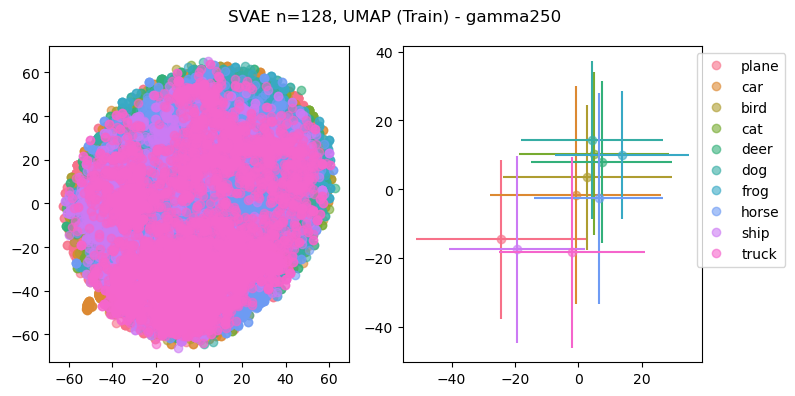

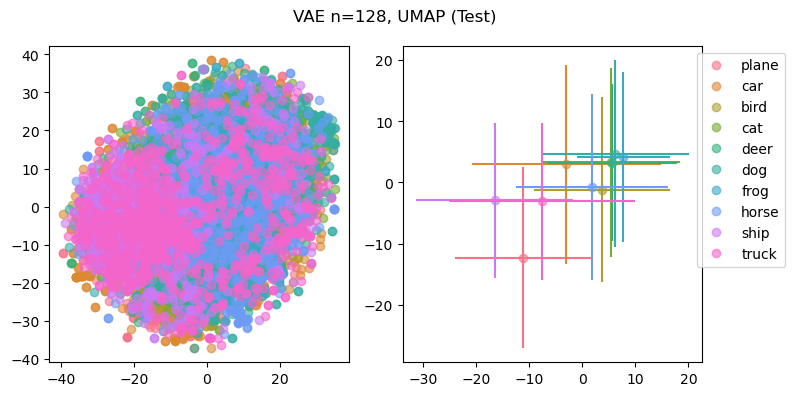

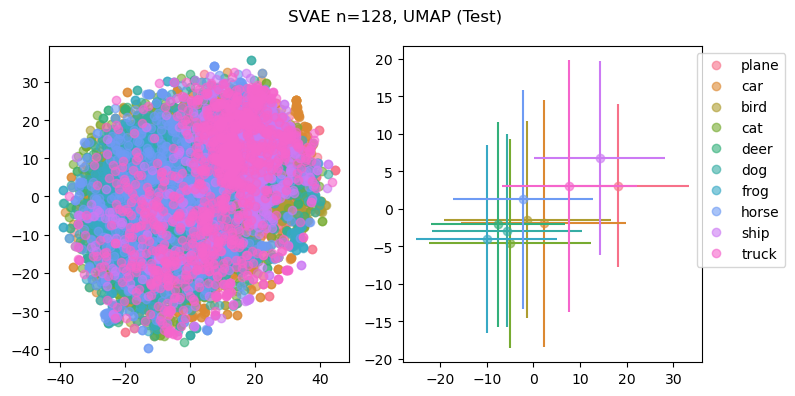

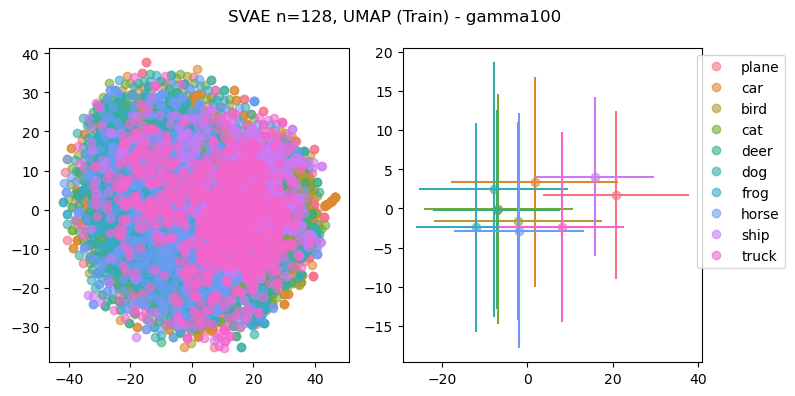

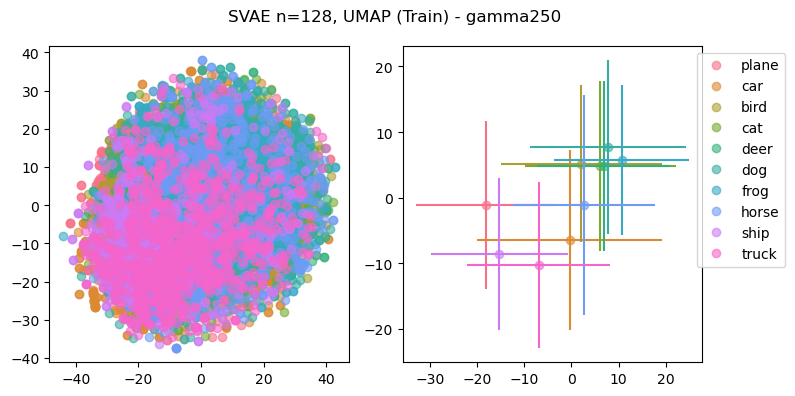

In [30]:
plot_latent2(latent_tsne,labels,title='VAE n=128, UMAp (Train)',average=True,figsize=(8,4))
plot_latent2(latent2_tsne,labels2,title='SVAE n=128, UMAP (Train)',average=True,figsize=(8,4))
plot_latent2(latent3_tsne,labels3,title='SVAE n=128, UMAP (Train) - gamma100',average=True,figsize=(8,4))
plot_latent2(latent4_tsne,labels4,title='SVAE n=128, UMAP (Train) - gamma250',average=True,figsize=(8,4))


plot_latent2(latent_val_tsne,labels_val,title='VAE n=128, UMAP (Test)',average=True,figsize=(8,4))
plot_latent2(latent2_val_tsne,labels2_val,title='SVAE n=128, UMAP (Test)',average=True,figsize=(8,4))
plot_latent2(latent3_val_tsne,labels3_val,title='SVAE n=128, UMAP (Train) - gamma100',average=True,figsize=(8,4))
plot_latent2(latent4_val_tsne,labels4_val,title='SVAE n=128, UMAP (Train) - gamma250',average=True,figsize=(8,4))


Reconstruction

What's the distribution of images for this normalization?


In [23]:
def plot_recon(model,dataloader, dataloader2=None,img_n=36,nrow=6,figsize=(20,10),title='SVAE'):

    batch = next(iter(dataloader))

    images, labels = batch 

    images_ori = torchvision.utils.make_grid(images[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()

    if dataloader2 is None:

        fig, axs = plt.subplots(1,2,figsize=figsize)
        axs[0].imshow(images_ori); axs[0].set_title('original')

        recons, _, _, class_logits = model.forward(images.to(device))
        images_recon = torchvision.utils.make_grid(recons[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()
        axs[1].imshow(images_recon); axs[1].set_title('reconstructed')

        plt.suptitle(title)
        plt.axis('off')
        plt.tight_layout()

        plt.show()

    else:
        fig, axs = plt.subplots(2,2,figsize=figsize)
        axs[0,0].imshow(images_ori); axs[0,0].set_title('original, train set')

        recons, _, _, class_logits = model.forward(images.to(device))
        images_recon = torchvision.utils.make_grid(recons[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()
        axs[0,1].imshow(images_recon); axs[0,1].set_title('reconstructed, train set')


        batch = next(iter(dataloader2))
        images, labels = batch 
        images_ori = torchvision.utils.make_grid(images[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()

        axs[1,0].imshow(images_ori); axs[1,0].set_title('original, test set')
        recons, _, _, class_logits = model.forward(images.to(device))
        images_recon = torchvision.utils.make_grid(recons[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()
        axs[1,1].imshow(images_recon); axs[1,1].set_title('reconstructed, test set')

        plt.suptitle(title)
        for i in range(2):
            for j in range(2):
                axs[i,j].axis('off')

        plt.tight_layout()

        plt.show()

def plot_recon2(model,images1, images2=None,img_n=36,nrow=6,figsize=(20,10),title='SVAE', is_svae=True):

    # batch = next(iter(dataloader))

    # images, labels = batch 

    images_ori = torchvision.utils.make_grid(images1[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()

    if images2 is None:

        fig, axs = plt.subplots(1,2,figsize=figsize)
        axs[0].imshow(images_ori); axs[0].set_title('original')

        if is_svae:
            recons, _, _, class_logits = model.forward(images1.to(device))
        else:
            recons, _, _ = model.forward(images1.to(device))
        images_recon = torchvision.utils.make_grid(recons[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()
        axs[1].imshow(images_recon); axs[1].set_title('reconstructed')

        plt.suptitle(title)
        plt.axis('off')
        plt.tight_layout()

        plt.show()

    else:
        fig, axs = plt.subplots(2,2,figsize=figsize)
        axs[0,0].imshow(images_ori); axs[0,0].set_title('original, train set')

        if is_svae:
            recons, _, _, class_logits = model.forward(images1.to(device))
        else:
            recons, _, _ = model.forward(images1.to(device))
        images_recon = torchvision.utils.make_grid(recons[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()
        axs[0,1].imshow(images_recon); axs[0,1].set_title('reconstructed, train set')

        images_ori = torchvision.utils.make_grid(images2[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()

        axs[1,0].imshow(images_ori); axs[1,0].set_title('original, test set')
        if is_svae:
            recons, _, _, class_logits = model.forward(images2.to(device))
        else:
            recons, _, _ = model.forward(images2.to(device))
        images_recon = torchvision.utils.make_grid(recons[:img_n,:,:,:],nrow=nrow).cpu().permute(1,2,0).numpy()
        axs[1,1].imshow(images_recon); axs[1,1].set_title('reconstructed, test set')

        plt.suptitle(title)
        for i in range(2):
            for j in range(2):
                axs[i,j].axis('off')

        plt.tight_layout()

        plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


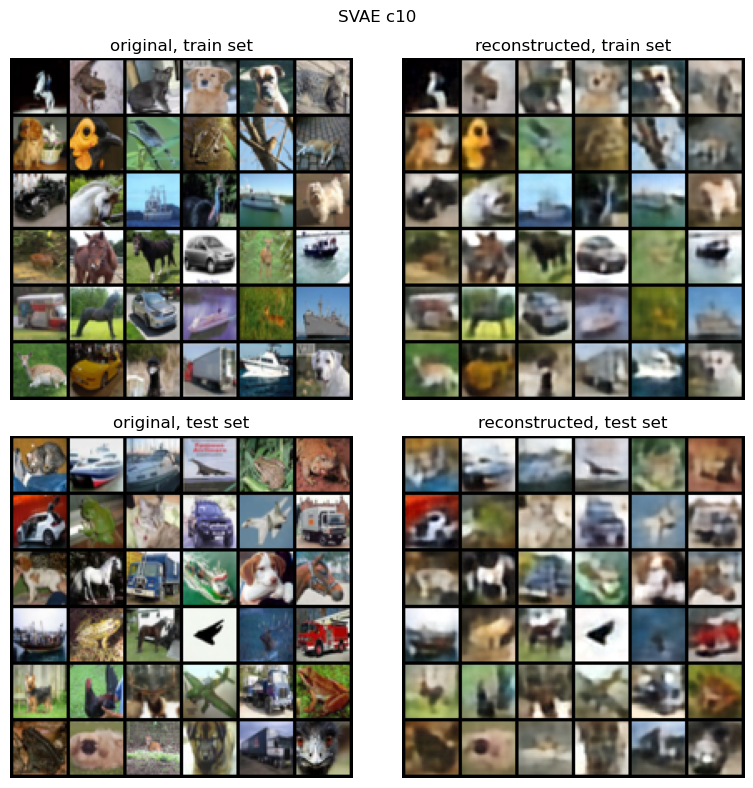

In [108]:
SVAE_last0 = SupervisedVAE_basic(latent_dim128, img_size, num_cat, VAE_instance).to(device)
SVAE_last0.load_state_dict(torch.load('./saved_params_svae_cifar-10_dim128_gamma1_basic_c10/'+'10.pth',map_location=device))
SVAE_last0.eval()
plot_recon2(SVAE_last0, train_images,test_images, title='SVAE c10',figsize=(8,8),is_svae=True)




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


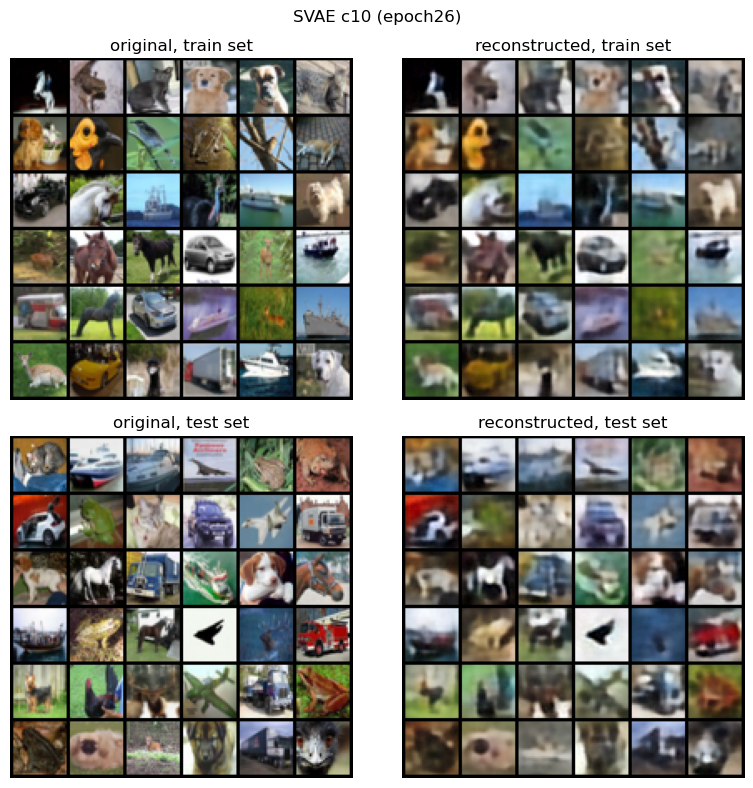

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


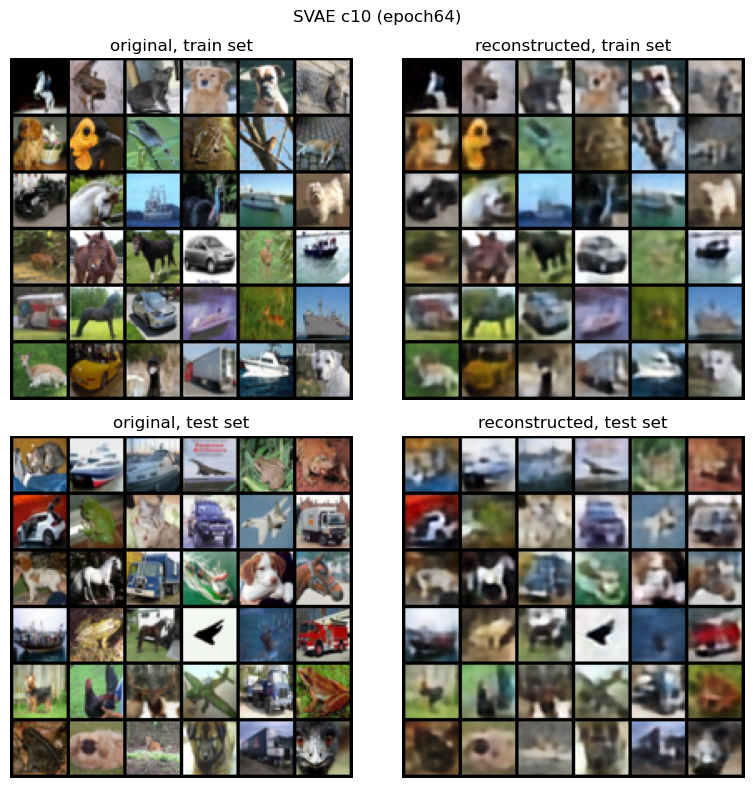

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


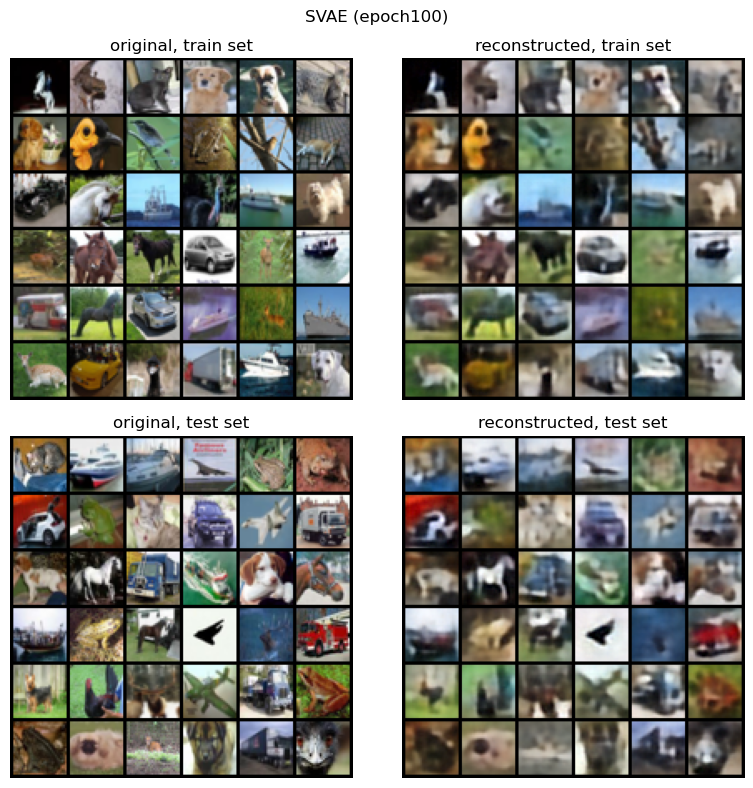

In [84]:
plot_recon2(SVAE_last25, train_images,test_images, title='SVAE c10 (epoch26)',figsize=(8,8),is_svae=True)
plot_recon2(SVAE_last63, train_images,test_images, title='SVAE c10 (epoch64)',figsize=(8,8),is_svae=True)
plot_recon2(SVAE_last100, train_images,test_images, title='SVAE (epoch100)',figsize=(8,8),is_svae=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


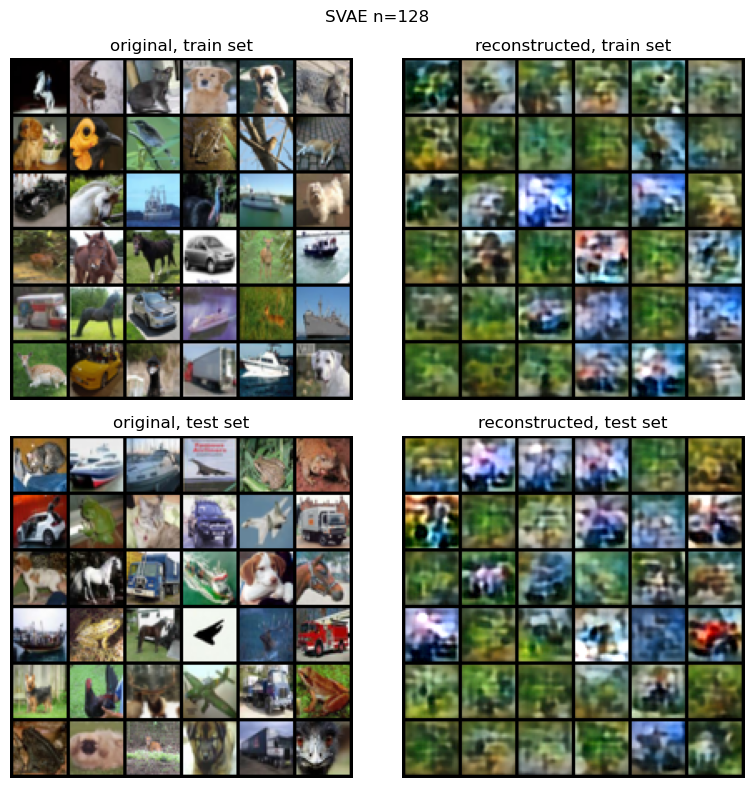

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


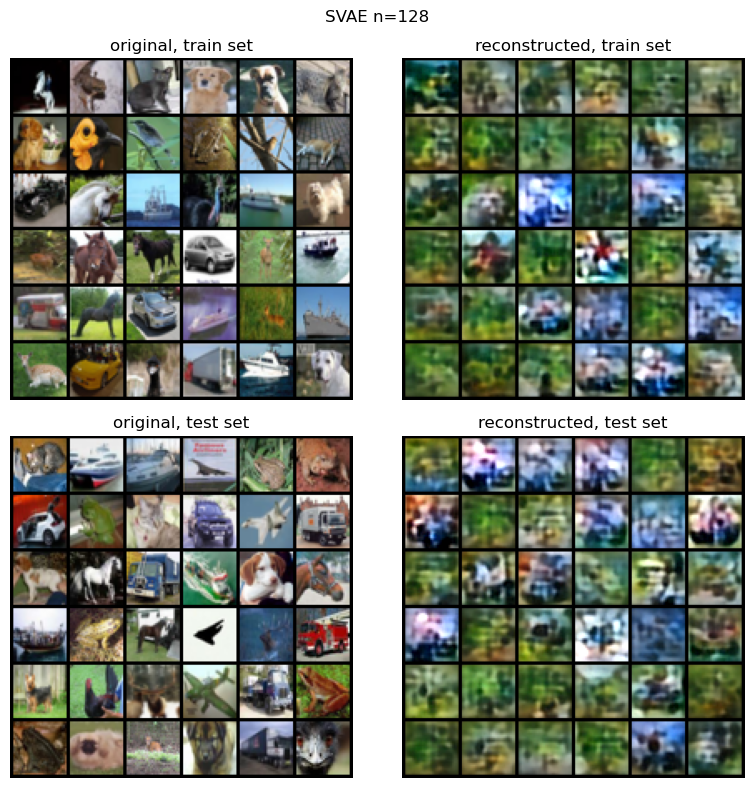

In [67]:
plot_recon2(SVAE_instance4, train_images,test_images, title='SVAE n=128',figsize=(8,8),is_svae=True)
plot_recon2(SVAE_instance4opt, train_images,test_images, title='SVAE n=128',figsize=(8,8),is_svae=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


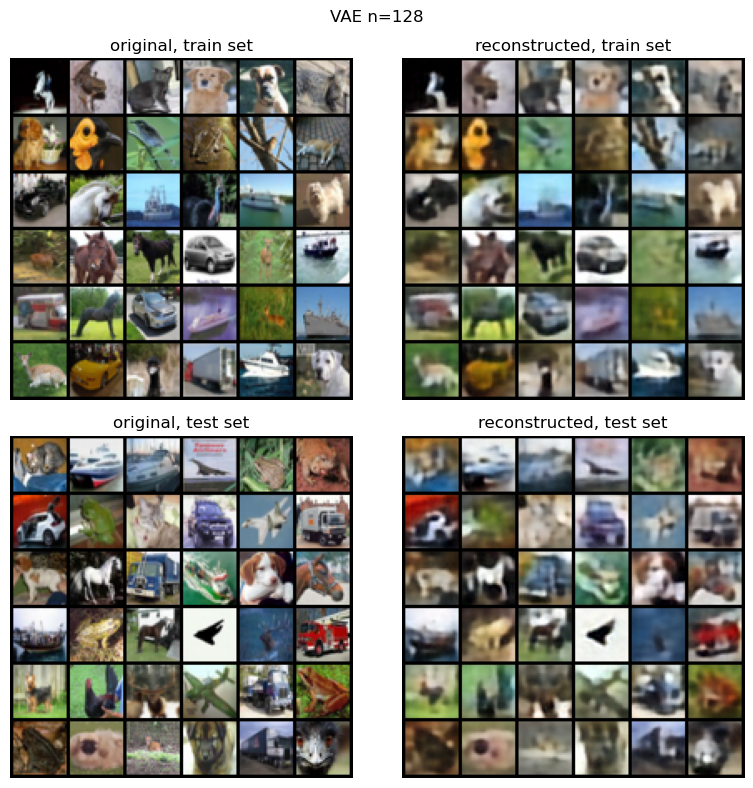

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


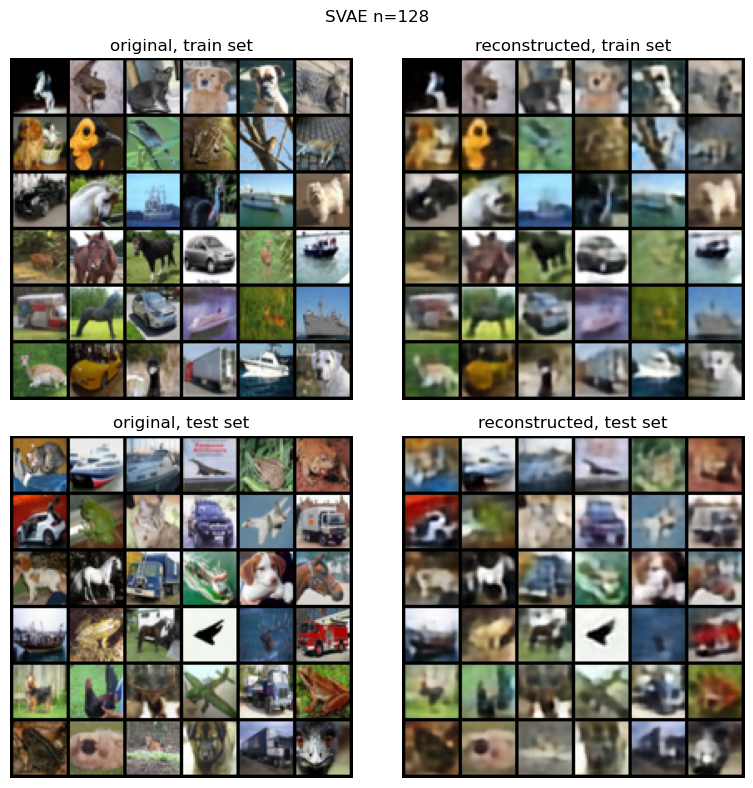

In [24]:
train_images,_ = next(iter(train_loader))
test_images,_ = next(iter(test_loader))

plot_recon2(VAE_instance, train_images,test_images, title='VAE n=128',figsize=(8,8),is_svae=False)
plot_recon2(SVAE_instance, train_images,test_images, title='SVAE n=128',figsize=(8,8),is_svae=True)

# plot_latent2(latent128_umap,labels128,title='SVAE n=128, UMAP',average=True,figsize=(8,4))
# plot_latent2(latent128s_umap,labels128s,title='SVAE n=128, lr2, UMAP',average=True,figsize=(8,4))
# plot_latent2(latent256_umap,labels256,title='SVAE n=256, UMAP',average=True,figsize=(8,4))
# plot_latent2(latent64_umap,labels64,title='SVAE n=64, UMAP',average=True,figsize=(8,4))
# plot_latent2(latent128_b10g10_umap,labels128_b10g10,title='SVAE n=128, b10g10, UMAP',average=True,figsize=(8,4))

In [86]:
# print( F.cross_entropy(torch.tensor([[0.,1.,0.,0.]]),torch.tensor([1])) )
# print( F.cross_entropy(torch.tensor([[.8,1.,0.,0.]]),torch.tensor([1])) )


# l1 = torch.nn.MSELoss()
# l2 = torch.nn.MSELoss(reduction='sum')

# print( l1(torch.tensor([[2.,2.,2.,2.]]),
#           torch.tensor([[2.,1.,1.,0.]])))

# print( l2(torch.tensor([[2.,2.,2.,2.]]),
#           torch.tensor([[2.,1.,1.,0.]])))

# # print( F.mse_loss(
# #         torch.tensor([[2.,2.,2.,2.]]),
# #         torch.tensor([[2.,1.,1.,0.]])) )


# print( F.cross_entropy(torch.tensor([[-2.,1.,-3.,2.]]), torch.tensor([1])) )
# print( F.cross_entropy(torch.tensor([[-2.,2.,-3.,2.]]), torch.tensor([1])) )
# print( F.cross_entropy(torch.tensor([[-5.,2.,-5.,-5.]]), torch.tensor([1])) )
# print( F.cross_entropy(torch.tensor([[-5.,2.,-5.,-5.]]), torch.tensor([[0.,1.,0.,0.]])) )

# print( F.cross_entropy(torch.tensor([[-5.,2.,-5.,1.]]), torch.tensor([[0.,1.,0.,1.]])) )

In [116]:
[len(train_acc), len(test_acc)]

[391, 100]

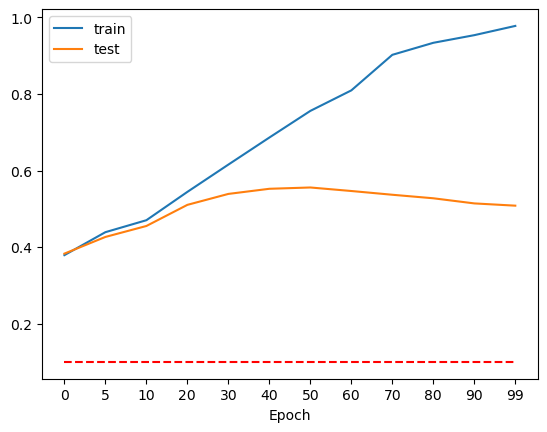

In [139]:

m_accs_train = np.mean(train_accs,axis=1)
sd_accs_train = np.std(train_accs,axis=1)
m_accs_test = np.mean(test_accs,axis=1)
sd_accs_test = np.std(test_accs,axis=1)


plt.plot(m_accs_train,label='train')
plt.plot(m_accs_test,label='test')
plt.xticks(range(len(m_accs_train)),list_path); plt.xlabel('Epoch')
plt.legend()

plt.plot([0,11],np.ones(2)*0.1,'r--')
# for i in range(len(m_accs_train)):
#     plt.plot([1,2], [m_accs_train[i], m_accs_test[i]], 'o-', label=f'{list_path[i]+1}th epoch')
#     plt.errorbar([1,2], [m_accs_train[i], m_accs_test[i]], [sd_accs_train[i], sd_accs_test[i]], \
#                  linestyle='none')

# plt.xlim((1-.2,2+.2))
# plt.xticks([1,2],labels=['train','test'])
# plt.ylim((0,1.2))
# plt.plot([1-.2,2+.2],np.ones(2)*0.1,'r--',label='chance level')
# plt.text(1,0.12,'chance level',color='red')
# plt.title('Classification Accuracy')
# plt.ylabel('Mean classification accuracy')
# plt.legend(bbox_to_anchor=(1,1))
# plt.show()

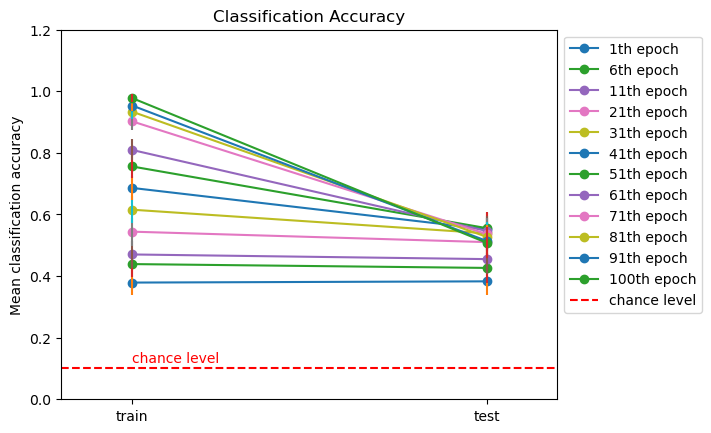

In [127]:
# print(f'train accuracy : {np.array(train_acc).mean()}')
# print(f'test accuracy : {np.array(test_acc).mean()}')

m_accs_train = np.mean(train_accs,axis=1)
sd_accs_train = np.std(train_accs,axis=1)
m_accs_test = np.mean(test_accs,axis=1)
sd_accs_test = np.std(test_accs,axis=1)


# m_accs = [np.array(train_acc).mean(),np.array(test_acc).mean()]
# sd_accs = [np.array(train_acc).std(),np.array(test_acc).std()]

for i in range(len(m_accs_train)):
    plt.plot([1,2], [m_accs_train[i], m_accs_test[i]], 'o-', label=f'{list_path[i]+1}th epoch')
    plt.errorbar([1,2], [m_accs_train[i], m_accs_test[i]], [sd_accs_train[i], sd_accs_test[i]], \
                 linestyle='none')

plt.xlim((1-.2,2+.2))
plt.xticks([1,2],labels=['train','test'])
plt.ylim((0,1.2))
plt.plot([1-.2,2+.2],np.ones(2)*0.1,'r--',label='chance level')
plt.text(1,0.12,'chance level',color='red')
plt.title('Classification Accuracy')
plt.ylabel('Mean classification accuracy')
plt.legend(bbox_to_anchor=(1,1))
plt.show()

train accuracy : 0.5806625639386189
test accuracy : 0.5349


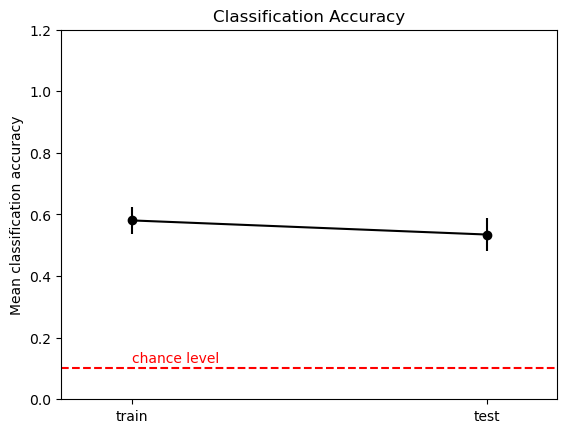

In [114]:
# print(f'train accuracy : {np.array(train_acc).mean()}')
# print(f'test accuracy : {np.array(test_acc).mean()}')

# m_acc = [np.array(train_acc).mean(),np.array(test_acc).mean()]
# sd_acc = [np.array(train_acc).std(),np.array(test_acc).std()]

# plt.plot( [1,2], m_acc, 'ko-')
# plt.errorbar([1,2], m_acc, sd_acc, color='black',linestyle='none')

# plt.xlim((1-.2,2+.2))
# plt.xticks([1,2],labels=['train','test'])
# plt.ylim((0,1.2))
# plt.plot([1-.2,2+.2],np.ones(2)*0.1,'r--',label='chance level')
# plt.text(1,0.12,'chance level',color='red')
# plt.title('Classification Accuracy')
# plt.ylabel('Mean classification accuracy')
# plt.show()